### Data

In [1]:
# data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import altair as alt
import plotly.graph_objects as go
import geopandas as gpd
from sklearn.preprocessing import StandardScaler


data = pd.read_csv('climate_change_impact_on_agriculture_2024.csv')

data.head()

,Year,Country,Region,Crop_Type,Average_Temperature_C,Total_Precipitation_mm,CO2_Emissions_MT,Crop_Yield_MT_per_HA,Extreme_Weather_Events,Irrigation_Access_%,Pesticide_Use_KG_per_HA,Fertilizer_Use_KG_per_HA,Soil_Health_Index,Adaptation_Strategies,Economic_Impact_Million_USD
0,2001,India,West Bengal,Corn,1.55,447.06,15.22,1.737,8,14.54,10.08,14.78,83.25,Water Management,808.13
1,2024,China,North,Corn,3.23,2913.57,29.82,1.737,8,11.05,33.06,23.25,54.02,Crop Rotation,616.22
2,2001,France,Ile-de-France,Wheat,21.11,1301.74,25.75,1.719,5,84.42,27.41,65.53,67.78,Water Management,796.96
3,2001,Canada,Prairies,Coffee,27.85,1154.36,13.91,3.890,5,94.06,14.38,87.58,91.39,No Adaptation,790.32
4,1998,India,Tamil Nadu,Sugarcane,2.19,1627.48,11.81,1.080,9,95.75,44.35,88.08,49.61,Crop Rotation,401.72


,Year,Country,Region,Crop_Type,Average_Temperature_C,Total_Precipitation_mm,CO2_Emissions_MT,Crop_Yield_MT_per_HA,Extreme_Weather_Events,Irrigation_Access_%,Pesticide_Use_KG_per_HA,Fertilizer_Use_KG_per_HA,Soil_Health_Index,Adaptation_Strategies,Economic_Impact_Million_USD
0,2001,India,West Bengal,Corn,1.55,447.06,15.22,1.737,8,14.54,10.08,14.78,83.25,Water Management,808.13
1,2024,China,North,Corn,3.23,2913.57,29.82,1.737,8,11.05,33.06,23.25,54.02,Crop Rotation,616.22
2,2001,France,Ile-de-France,Wheat,21.11,1301.74,25.75,1.719,5,84.42,27.41,65.53,67.78,Water Management,796.96
3,2001,Canada,Prairies,Coffee,27.85,1154.36,13.91,3.890,5,94.06,14.38,87.58,91.39,No Adaptation,790.32
4,1998,India,Tamil Nadu,Sugarcane,2.19,1627.48,11.81,1.080,9,95.75,44.35,88.08,49.61,Crop Rotation,401.72


### Initially looking at climate change across the world

In [2]:
# Ensure Year and Temperature columns are numeric
data["Year"] = pd.to_numeric(data["Year"], errors="coerce")
data = data.dropna(subset=["Year", "Average_Temperature_C", "Country"])

# Filter data for 1990-1991 and 2023-2024, and calculate the mean temperature for each period
data_1990_1991 = data[data["Year"].isin([1990, 1991])].groupby("Country")["Average_Temperature_C"].mean().reset_index()
data_2023_2024 = data[data["Year"].isin([2023, 2024])].groupby("Country")["Average_Temperature_C"].mean().reset_index()

# Merge the 1990-1991 and 2023-2024 average temperature data for each country
temp_change = pd.merge(data_1990_1991, data_2023_2024, on="Country", suffixes=("_1990_1991", "_2023_2024"))

# Calculate the temperature difference between the two periods (2023-2024 - 1990-1991)
temp_change["Total_Change"] = temp_change["Average_Temperature_C_2023_2024"] - temp_change["Average_Temperature_C_1990_1991"]

# Create choropleth map with reversed color scale
fig = px.choropleth(
    temp_change,
    locations="Country",
    locationmode="country names",
    color="Total_Change",
    hover_name="Country",
    title="Temperature Change from 1990-1991 to 2023-2024",
    color_continuous_scale="RdBu_r",  # Reversed color scale: Hotter = Red, Cooler = Blue
    labels={"Total_Change": "Total Change (°C)"}
)

fig.update_layout(
    autosize=True,
    width=None,
    height=500,
    title_x=0.4,
    geo=dict(
        showframe=False,
        showcoastlines=True,
        projection_type="natural earth"
    )
)

fig.show()

fig.write_html('global_temp_change.html')


### Extreme weather changes

In [3]:
# Ensure Year and Extreme Weather Events columns are numeric
data["Year"] = pd.to_numeric(data["Year"], errors="coerce")
data = data.dropna(subset=["Year", "Extreme_Weather_Events", "Country"])

# Filter data for 1990-1991 and 2023-2024, and calculate the mean number of extreme weather events for each period
data_1990_1991 = data[data["Year"].isin([1990, 1991])].groupby("Country")["Extreme_Weather_Events"].mean().reset_index()
data_2023_2024 = data[data["Year"].isin([2023, 2024])].groupby("Country")["Extreme_Weather_Events"].mean().reset_index()

# Merge the 1990-1991 and 2023-2024 extreme weather data for each country
weather_change = pd.merge(data_1990_1991, data_2023_2024, on="Country", suffixes=("_1990_1991", "_2023_2024"))

# Calculate the change in extreme weather events (2023-2024 - 1990-1991)
weather_change["Total_Change"] = weather_change["Extreme_Weather_Events_2023_2024"] - weather_change["Extreme_Weather_Events_1990_1991"]

# Create choropleth map to show the change in extreme weather events
fig = px.choropleth(
    weather_change,
    locations="Country",
    locationmode="country names",
    color="Total_Change",
    hover_name="Country",
    title="Change in Extreme Weather Events (1990 to 2024)",
    color_continuous_scale="RdBu_r",  # Red (Increase) to Blue (Decrease)
    labels={"Total_Change": "Change in Extreme Weather Events"}
)

fig.update_layout(
    autosize=True,
    width=None,
    height=500,
    title_x=0.4,
    geo=dict(
        showframe=False,
        showcoastlines=True,
        projection_type="natural earth"
    )
)

fig.show()

# Save the plot as an HTML file
fig.write_html('global_extreme_weather_change.html')


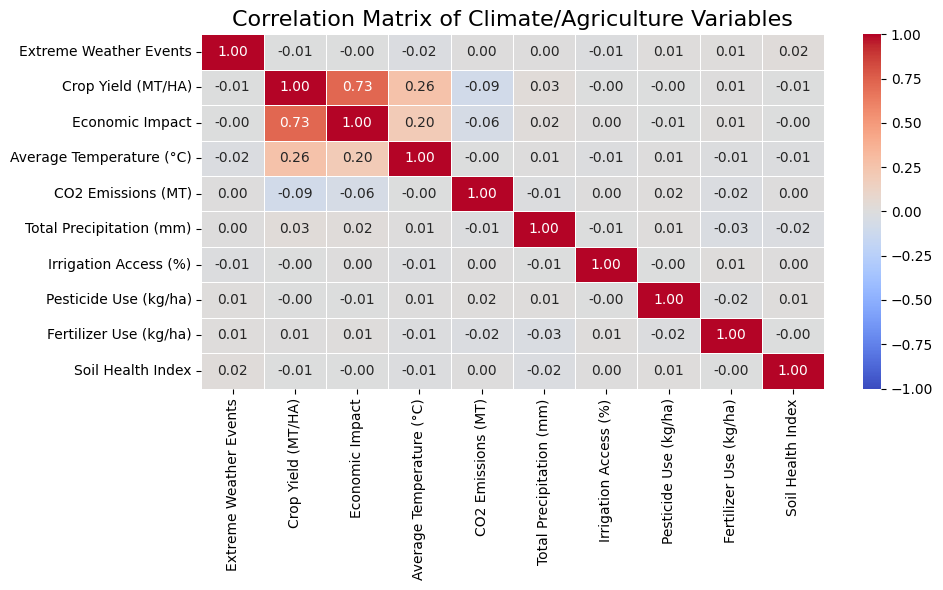

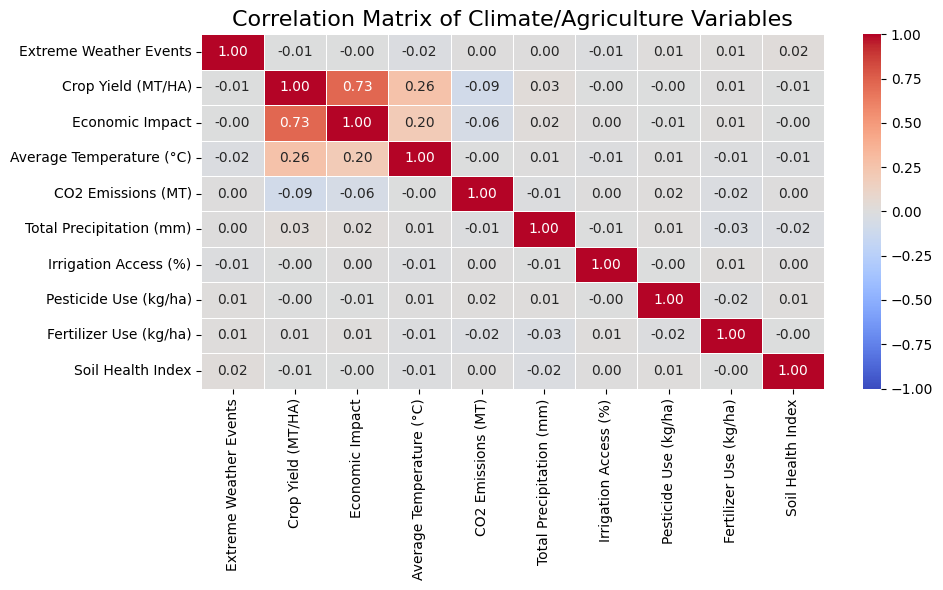

In [16]:
from sklearn.preprocessing import PolynomialFeatures
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

numeric_data = data.select_dtypes(include=["float", "int"]).fillna(0)  # Replace NaN with 0 or mean

column_labels = {
    "Extreme_Weather_Events": "Extreme Weather Events",
    "Crop_Yield_MT_per_HA": "Crop Yield (MT/HA)",
    'Economic_Impact_Million_USD': 'Economic Impact',
    "Average_Temperature_C": "Average Temperature (°C)",
    "CO2_Emissions_MT": "CO2 Emissions (MT)",
    "Total_Precipitation_mm": "Total Precipitation (mm)",
    "Irrigation_Access_%": "Irrigation Access (%)",
    "Pesticide_Use_KG_per_HA": "Pesticide Use (kg/ha)",
    "Fertilizer_Use_KG_per_HA": "Fertilizer Use (kg/ha)",
    "Soil_Health_Index": "Soil Health Index",
}

numeric_data = numeric_data[column_labels.keys()]
correlation_matrix = numeric_data.corr()
correlation_matrix.rename(columns=column_labels, index=column_labels, inplace=True)

# cleaned heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap="coolwarm",
    fmt=".2f",
    linewidths=0.5,
    vmin=-1,
    vmax=1,
    annot_kws={"fontsize": 10},
)

plt.title("Correlation Matrix of Climate/Agriculture Variables", fontsize=16)
plt.xticks(fontsize=10, rotation=90)
plt.yticks(fontsize=10, rotation=0)
plt.tight_layout()
plt.savefig("cleaned_correlation_matrix.png", format="png")

### Looking at if temperature affects this and there seems to be ideal temperature around 10-20 degrees celcius

In [5]:
fig = px.scatter(
    data,
    x="Average_Temperature_C",
    y="Crop_Yield_MT_per_HA",
    color="Extreme_Weather_Events",
    size="Extreme_Weather_Events",
    hover_name="Country",
    animation_frame="Year",
    title="Impact of Temperature on Crop Yield (Colored by Extreme Weather Events)",
    color_continuous_scale="YlOrRd",
    labels={
        "Average_Temperature_C": "Average Temperature (°C)",
        "Crop_Yield_MT_per_HA": "Crop Yield (MT/HA)"
    }
)

fig.update_layout(
    width=900,
    height=600,
    title_x=0.5,
    margin=dict(l=50, r=50, t=50, b=50)
)
fig.show()


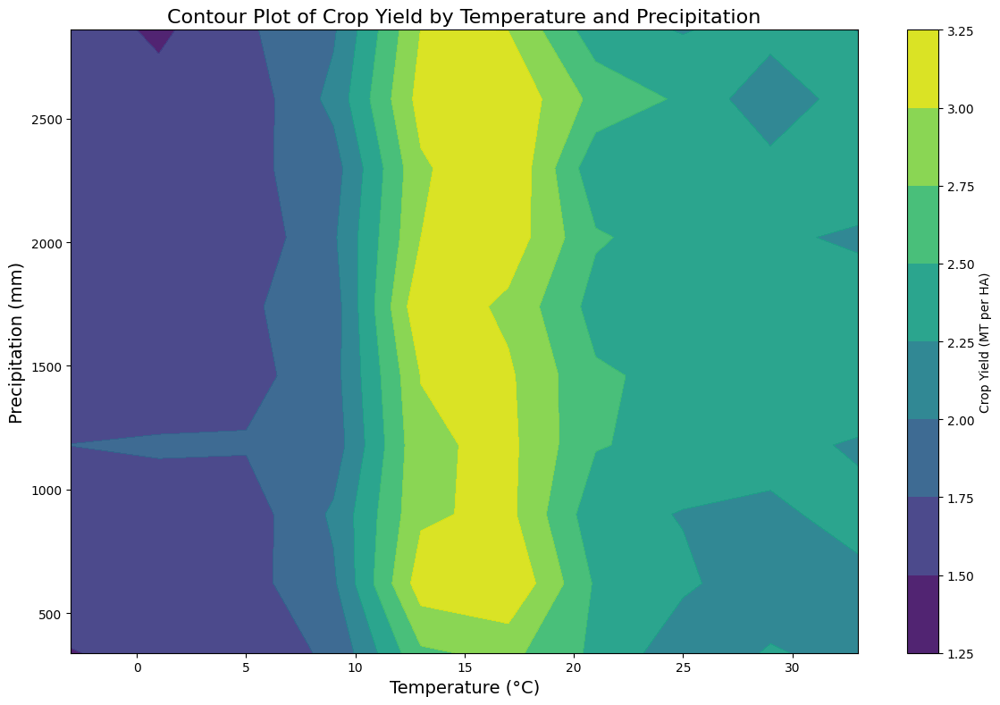

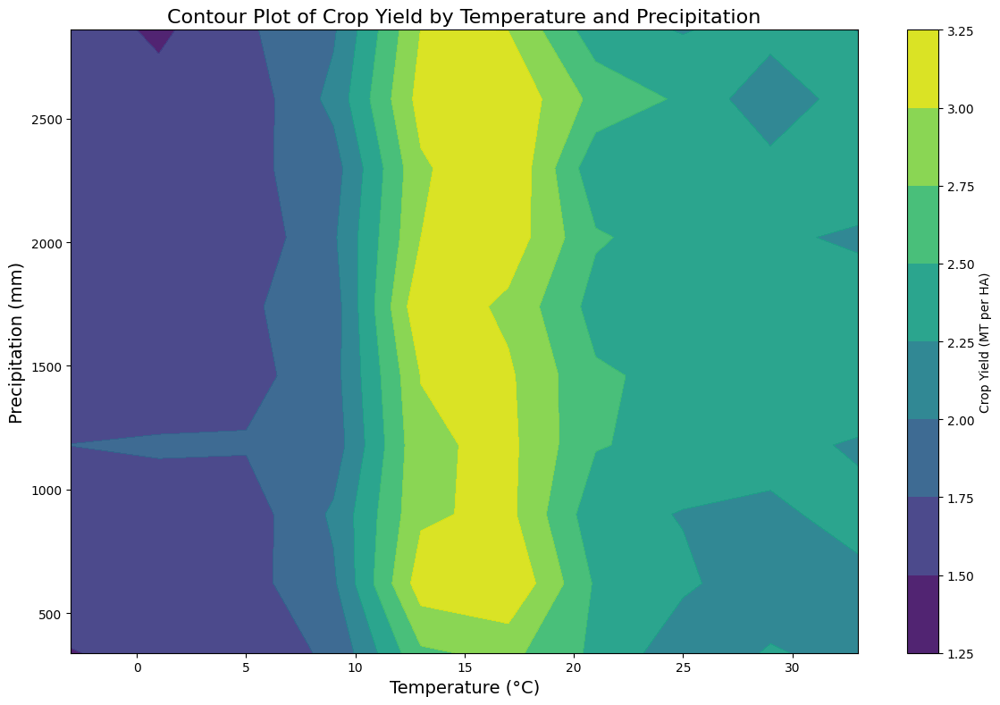

In [20]:
import numpy as np

# Create categorical objects to access bin edges
temp_bins = pd.cut(data["Average_Temperature_C"], bins=10)
precip_bins = pd.cut(data["Total_Precipitation_mm"], bins=10)

# Extract bin edges for readable labels
temp_bin_edges = temp_bins.cat.categories.mid  # Midpoints for bin labels
precip_bin_edges = precip_bins.cat.categories.mid  # Midpoints for bin labels

# Pivot table for heatmap
data["Temp_Bin"] = temp_bins.cat.codes  # Assign numeric bin codes
data["Precip_Bin"] = precip_bins.cat.codes  # Assign numeric bin codes
heatmap_data = data.pivot_table(
    index="Temp_Bin", columns="Precip_Bin", values="Crop_Yield_MT_per_HA", aggfunc="mean"
)

plt.figure(figsize=(12, 8))
X, Y = np.meshgrid(temp_bin_edges, precip_bin_edges)
Z = heatmap_data.values.T  # Transpose for alignment

cp = plt.contourf(X, Y, Z, cmap="viridis", alpha=0.95)
plt.colorbar(cp, label="Crop Yield (MT per HA)")
plt.title("Contour Plot of Crop Yield by Temperature and Precipitation", fontsize=16)
plt.xlabel("Temperature (°C)", fontsize=14)
plt.ylabel("Precipitation (mm)", fontsize=14)
plt.tight_layout()
plt.show()

plt.savefig("crop_yield_contour_plot.png", dpi=300) 
plt.close() 

Correlation between Temperature and Crop Yield: 0.26378072469850977
Correlation between Temperature and Crop Yield: 0.26378072469850977


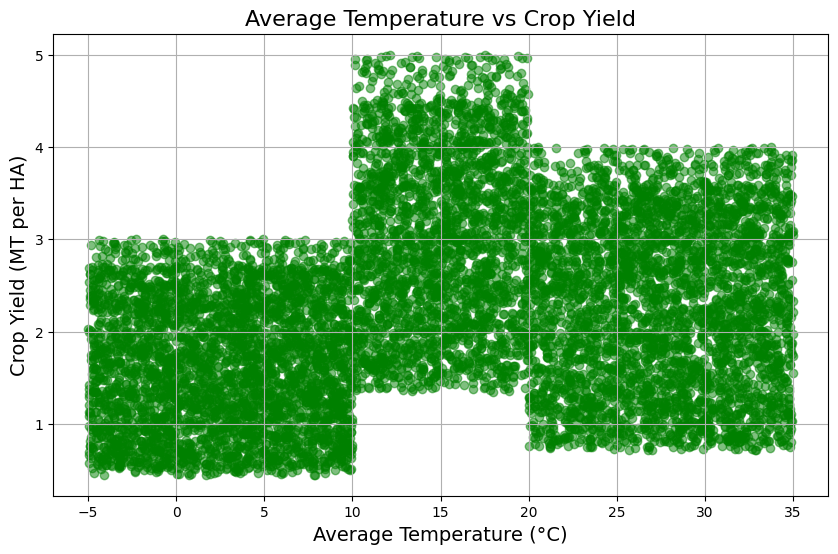

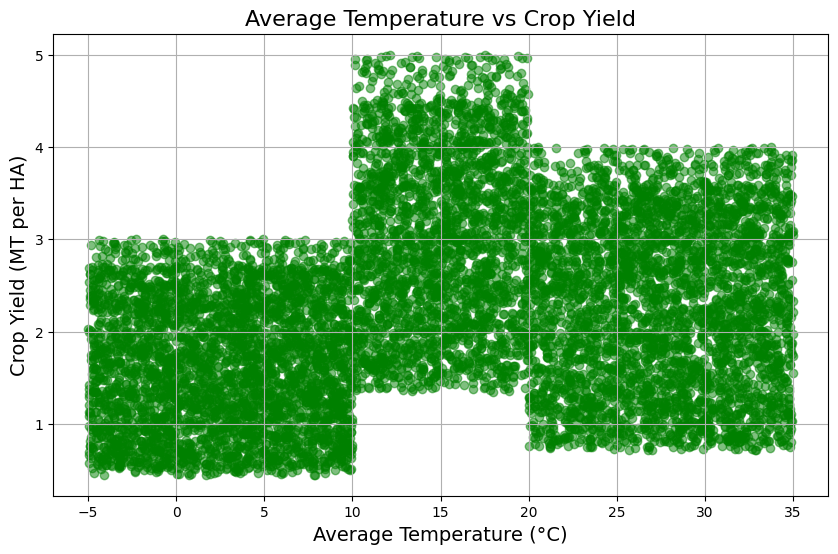

In [6]:
correlation = data['Average_Temperature_C'].corr(data['Crop_Yield_MT_per_HA'])
print(f'Correlation between Temperature and Crop Yield: {correlation}')

# Create a scatter plot of Temperature vs Crop Yield
plt.figure(figsize=(10,6))
plt.scatter(data['Average_Temperature_C'], data['Crop_Yield_MT_per_HA'], alpha=0.5, color='green')
plt.title('Average Temperature vs Crop Yield', fontsize=16)
plt.xlabel('Average Temperature (°C)', fontsize=14)
plt.ylabel('Crop Yield (MT per HA)', fontsize=14)
plt.grid(True)

plt.savefig('temp_crop_yield.png', format='png')

plt.show()


### 3 visualizations below where we try to analyze what drives highest and lowest crop yield while acknowledging the difference is pretty small

In [7]:
pip install --upgrade "vegafusion[embed]>=1.5.0,<2.0" "vegafusion-python-embed>=1.5.0,<2.0"

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


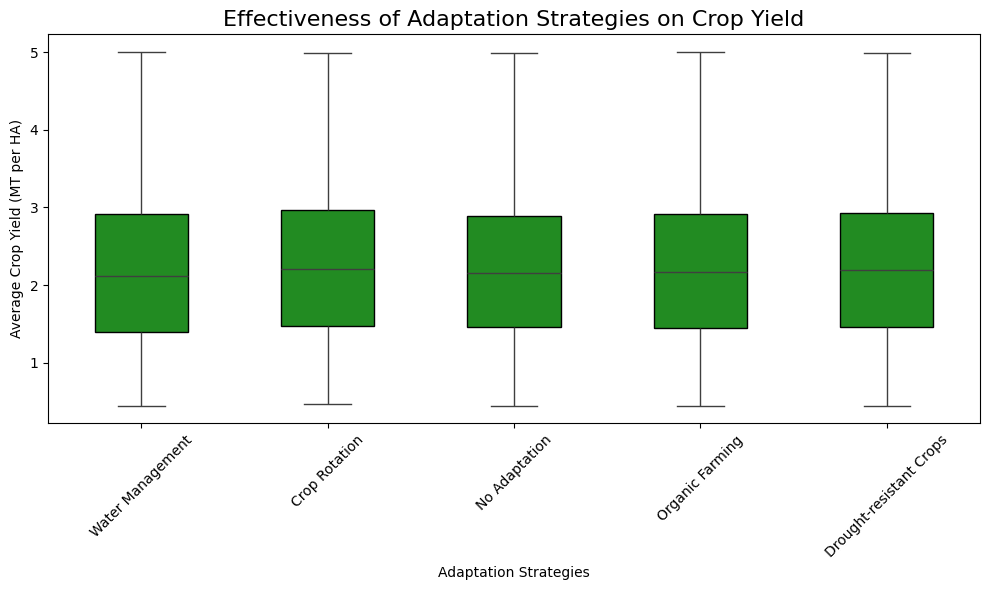

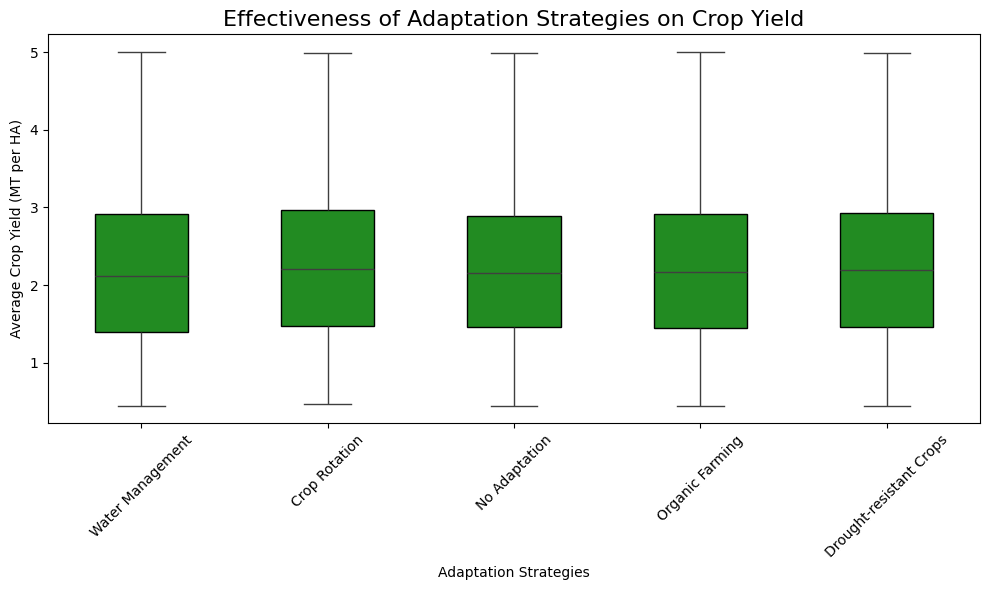

In [8]:
plt.figure(figsize=(10, 6))

sns.boxplot(data=data, x='Adaptation_Strategies', y='Crop_Yield_MT_per_HA', 
            width=0.5, fliersize=5, 
            boxprops=dict(facecolor='forestgreen', edgecolor='black')
           )


plt.title("Effectiveness of Adaptation Strategies on Crop Yield", fontsize=16)
plt.xlabel('Adaptation Strategies')
plt.ylabel('Average Crop Yield (MT per HA)')

plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('cropyield_strategies.png')
plt.show()


### Regional analysis and choosing which countries to look at based on crop yield

In [21]:
import pandas as pd
import altair as alt

#load data
data = pd.read_csv('climate_change_impact_on_agriculture_2024.csv')

# year column to int
data['Year'] = data['Year'].astype(int)

# filter data for years 1990-2024
data_filtered = data[(data['Year'] == 1990) | (data['Year'] == 2024)]

# find avg crop yield per country in 1990/ 2024
yield_change = data_filtered.groupby(['Country', 'Year'], as_index=False).agg(
    Avg_Crop_Yield=('Crop_Yield_MT_per_HA', 'mean')
)

yield_1990 = yield_change[yield_change['Year'] == 1990]
yield_2024 = yield_change[yield_change['Year'] == 2024]

# merge two datasets and find percentage change
change = pd.merge(yield_1990[['Country', 'Avg_Crop_Yield']], 
                  yield_2024[['Country', 'Avg_Crop_Yield']], 
                  on='Country', suffixes=('_1990', '_2024'))

# percentage change 1990-2024 for each country
change['Total_Yield_Change_Percentage'] = ((change['Avg_Crop_Yield_2024'] - change['Avg_Crop_Yield_1990']) / change['Avg_Crop_Yield_1990']) * 100

#top 3 countries w/ the largest increase
top_increase = change.sort_values(by='Total_Yield_Change_Percentage', ascending=False).head(3)

#top 3 countries w/ the largest decrease
top_decrease = change.sort_values(by='Total_Yield_Change_Percentage', ascending=True).head(3)

# include opacity column to highlight the 'tops'
top_increase['Opacity'] = top_increase['Country'].apply(lambda x: 1 if x == top_increase['Country'].iloc[0] else 0.3)
top_decrease['Opacity'] = top_decrease['Country'].apply(lambda x: 1 if x == top_decrease['Country'].iloc[0] else 0.3)

# chart for largest increase sorted in descending order
chart_increase = alt.Chart(top_increase).mark_bar(color='#006400').encode(  # Dark green
    x=alt.X('Country:N', title=None, sort=alt.SortField(field='Total_Yield_Change_Percentage', order='descending'),
            axis=alt.Axis(labelFontSize=14, grid=False)),  # increase x-axis font size and remove grid lines
    y=alt.Y('Total_Yield_Change_Percentage:Q', title='Total Yield Change (%)',
            axis=alt.Axis(labelFontSize=14, titleFontSize=14, grid=False)),  
    opacity=alt.Opacity('Opacity:Q', legend=None) 
).properties(
    title='Top 3 Countries with the Largest Increase in Crop Yield (1990-2024)',
    width=300,
    height=400
)

# chart for largest decrease sorted in ascending order
chart_decrease = alt.Chart(top_decrease).mark_bar(color='#8B0000').encode(
    x=alt.X('Country:N', title=None, sort=alt.SortField(field='Total_Yield_Change_Percentage', order='ascending'),
            axis=alt.Axis(labelFontSize=14, grid=False)), 
    y=alt.Y('Total_Yield_Change_Percentage:Q', title='Total Yield Change (%)',
            axis=alt.Axis(labelFontSize=14, titleFontSize=14, grid=False)), 
    opacity=alt.Opacity('Opacity:Q', legend=None) 
).properties(
    title='Top 3 Countries with the Largest Decrease in Crop Yield (1990-2024)',
    width=300,
    height=400
)

# combine charts
chart_increase | chart_decrease

alt.HConcatChart(...)

alt.HConcatChart(...)

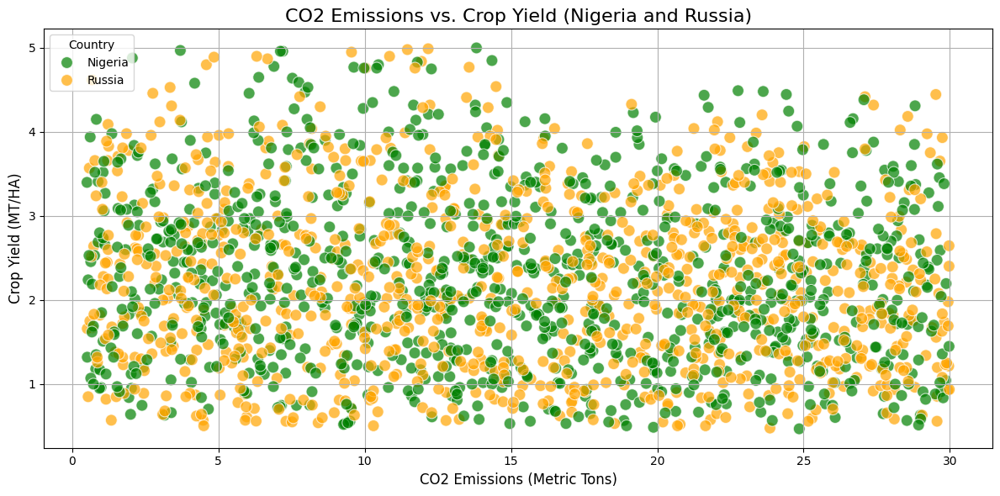

Correlations (CO2 Emissions vs. Crop Yield):
Nigeria: -0.10
Russia: -0.09


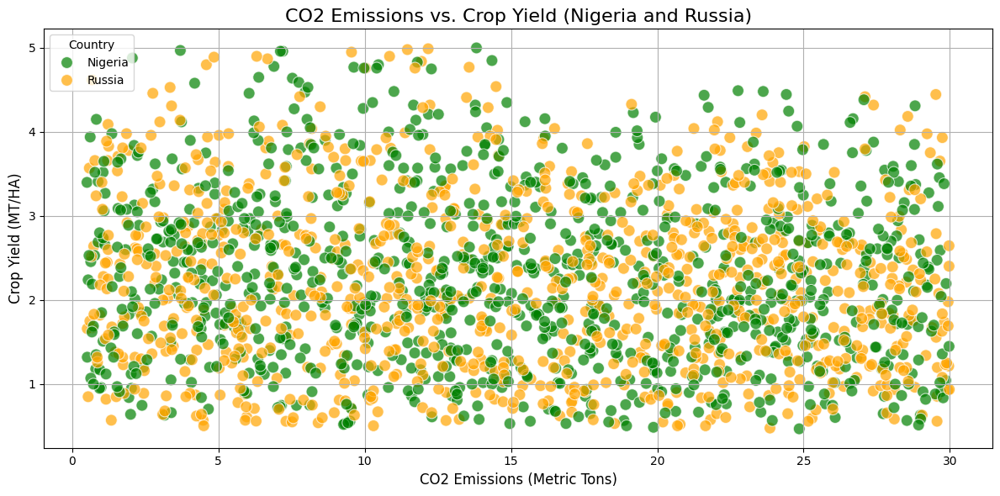

Correlations (CO2 Emissions vs. Crop Yield):
Nigeria: -0.10
Russia: -0.09


In [10]:
# Filter data for Nigeria and Russia
nigeria_russia_data = data[data["Country"].isin(["Nigeria", "Russia"])]

# Scatter plot: CO2 Emissions vs. Crop Yield for Nigeria and Russia
plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=nigeria_russia_data,
    x="CO2_Emissions_MT",
    y="Crop_Yield_MT_per_HA",
    hue="Country",
    palette={"Nigeria": "green", "Russia": "orange"},
    s=100,
    alpha=0.7
)
plt.title("CO2 Emissions vs. Crop Yield (Nigeria and Russia)", fontsize=16)
plt.xlabel("CO2 Emissions (Metric Tons)", fontsize=12)
plt.ylabel("Crop Yield (MT/HA)", fontsize=12)
plt.grid()
plt.legend(title="Country", loc="upper left", fontsize=10)
plt.tight_layout()
plt.show()

# Calculate correlation for each country using Pandas
correlations = {}
for country in ["Nigeria", "Russia"]:
    country_data = nigeria_russia_data[nigeria_russia_data["Country"] == country]
    correlations[country] = country_data["CO2_Emissions_MT"].corr(country_data["Crop_Yield_MT_per_HA"])

# Print correlations
print("Correlations (CO2 Emissions vs. Crop Yield):")
for country, corr in correlations.items():
    print(f"{country}: {corr:.2f}")


### Create data for d3 plot

In [11]:
import json

df = pd.read_csv("climate_change_impact_on_agriculture_2024.csv")

# filter for Nigeria and Russia
nigeria_russia_data = df[df["Country"].isin(["Nigeria", "Russia"])]

# select relevant columns for d3 (e.g., Country, CO2 Emissions, Crop Yield)
nigeria_russia_filtered = nigeria_russia_data[["Year", "Country", "CO2_Emissions_MT", "Crop_Yield_MT_per_HA"]]

# convert data to dictionary
data_dict = nigeria_russia_filtered.to_dict(orient="records")

# save filtered data as a JSON file
with open("nigeria_russia_data.json", "w") as json_file:
    json.dump(data_dict, json_file)


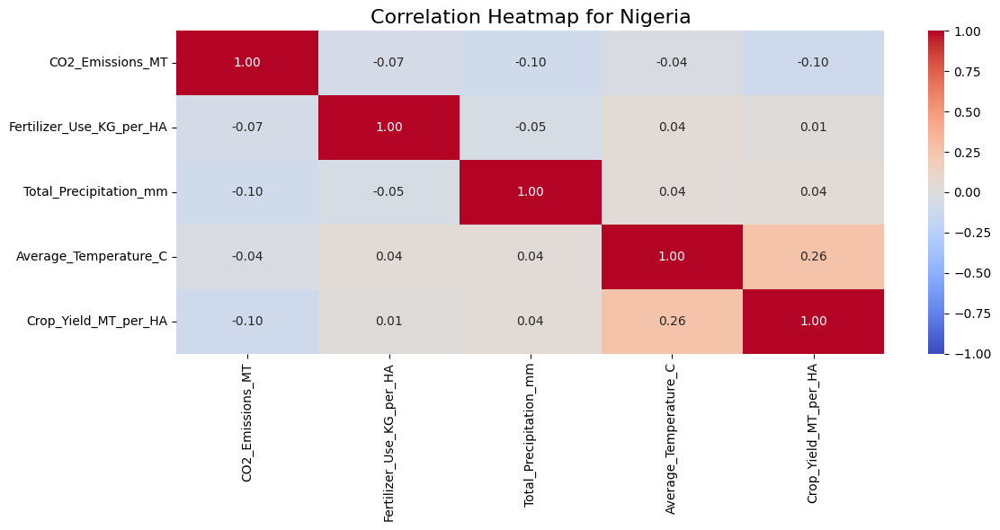

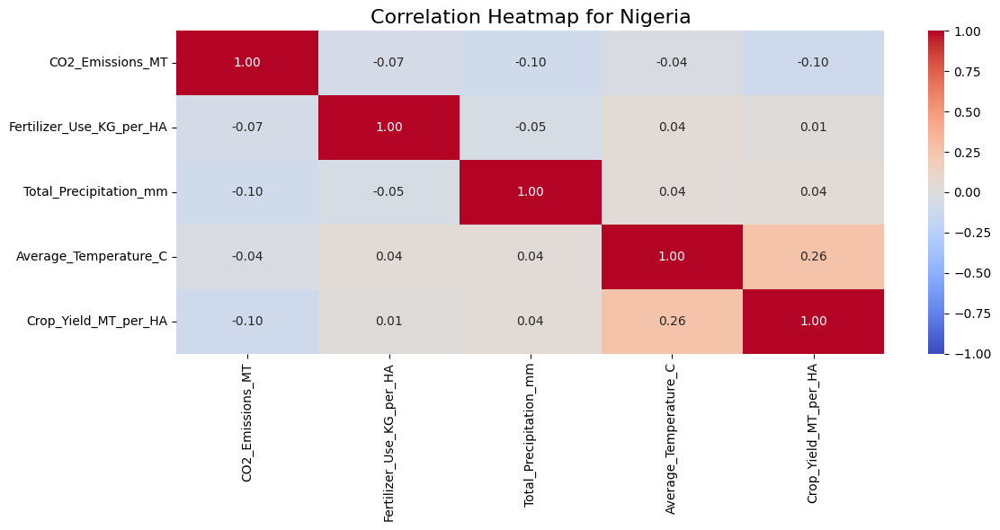

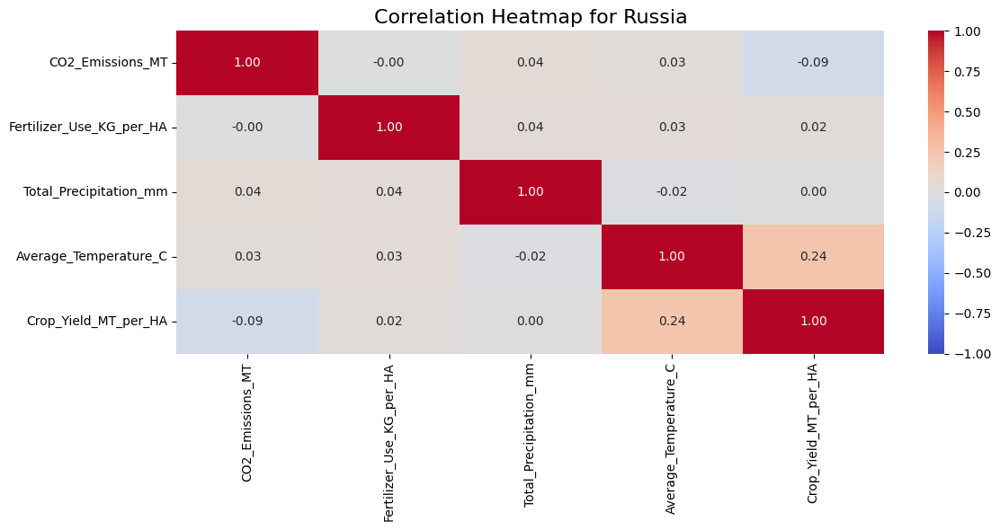

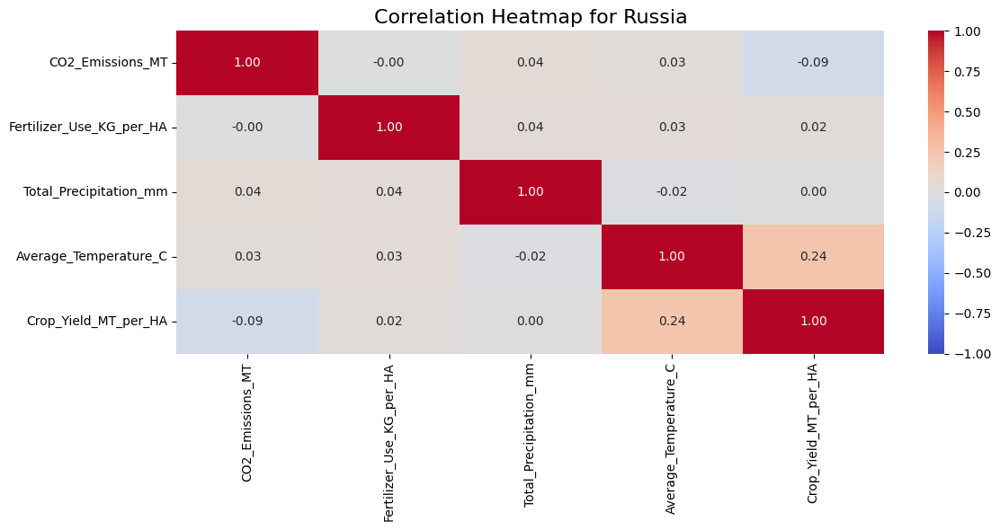

In [12]:
# Filter data for Nigeria and Russia
nigeria_data = nigeria_russia_data[nigeria_russia_data['Country'] == 'Nigeria']
russia_data = nigeria_russia_data[nigeria_russia_data['Country'] == 'Russia']

# Compute the correlation matrices
nigeria_corr_matrix = nigeria_data[['CO2_Emissions_MT', 'Fertilizer_Use_KG_per_HA', 
                                    'Total_Precipitation_mm', 'Average_Temperature_C', 
                                    'Crop_Yield_MT_per_HA']].corr()

russia_corr_matrix = russia_data[['CO2_Emissions_MT', 'Fertilizer_Use_KG_per_HA', 
                                  'Total_Precipitation_mm', 'Average_Temperature_C', 
                                  'Crop_Yield_MT_per_HA']].corr()

# Plot Nigeria correlation heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(nigeria_corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", vmin=-1, vmax=1)
plt.title("Correlation Heatmap for Nigeria", fontsize=16)
plt.tight_layout()
plt.show()

# Plot Russia correlation heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(russia_corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", vmin=-1, vmax=1)
plt.title("Correlation Heatmap for Russia", fontsize=16)
plt.tight_layout()
plt.show()


### Interactive Plot

In [17]:
import pandas as pd
import altair as alt


data = pd.read_csv('climate_change_impact_on_agriculture_2024.csv')

# Filter columns 
data_clean = data[['Crop_Type', 'Adaptation_Strategies']].dropna()

# frequency of adaptation strategies for each crop type
adaptation_counts = data_clean.groupby(['Crop_Type', 'Adaptation_Strategies']).size().reset_index(name='count')

#interactive dropdown for crop type
crop_dropdown = alt.binding_select(options=data['Crop_Type'].unique().tolist(), name="Select Crop Type:")
selection = alt.selection_single(fields=['Crop_Type'], bind=crop_dropdown, name='Crop')

# bar chart based on selected crop type
chart = alt.Chart(adaptation_counts).mark_bar(color='steelblue').encode(
    x=alt.X('Adaptation_Strategies:N', title='Adaptation Strategy'),
    y=alt.Y('count:Q', title='Count'),
    tooltip=['Adaptation_Strategies:N', 'count:Q']
).add_selection(
    selection
).transform_filter(
    selection
).properties(
    width=600,
    height=300
)

#title chart
title_chart = alt.Chart(pd.DataFrame({'title': ['Top Adaptation Strategies for Selected Crop Type']})).mark_text(
    align='center',
    fontSize=16,
    fontWeight='bold'
).encode(
    text='title:N'
).properties(width=600, height=50)

# subtitle chart with default message when no selection is made
subtitle_chart = alt.Chart(pd.DataFrame({'message': ['Please select a crop type']})).mark_text(
    align='center',
    fontSize=14
).encode(
    text=alt.condition(
        selection,
        alt.Text('Crop_Type:N', title='Crop Type: '),
        alt.value('Please select a crop type')  # Default message when no selection is made
    )
).properties(width=600, height=30)

# Combine charts
final_chart = alt.vconcat(
    title_chart,
    subtitle_chart,
    chart
).resolve_scale(
    color='independent'
)

final_chart.save("crop_adaptation_interactive_plot_with_selector.html")

C:\Users\dulig\AppData\Local\Temp\ipykernel_54876\2943207857.py:15: AltairDeprecationWarning:

Deprecated in `altair=5.0.0`. Use selection_point instead.

C:\Users\dulig\AppData\Local\Temp\ipykernel_54876\2943207857.py:18: AltairDeprecationWarning:

Deprecated in `altair=5.0.0`. Use add_params instead.

C:\Users\dulig\AppData\Local\Temp\ipykernel_54876\2943207857.py:15: AltairDeprecationWarning:

Deprecated in `altair=5.0.0`. Use selection_point instead.

C:\Users\dulig\AppData\Local\Temp\ipykernel_54876\2943207857.py:18: AltairDeprecationWarning:

Deprecated in `altair=5.0.0`. Use add_params instead.



In [13]:
# calculating most and least effective adaptation strategies
df['Adaptation_Strategies'] = df['Adaptation_Strategies'].fillna('No Strategy')

avg_yield_by_strategy = df.groupby('Adaptation_Strategies')['Crop_Yield_MT_per_HA'].mean()

best_strategy = avg_yield_by_strategy.idxmax()
best_strategy_avg_yield = avg_yield_by_strategy.max()
no_strategy_avg_yield = avg_yield_by_strategy['No Strategy'] if 'No Strategy' in avg_yield_by_strategy else None

print(f"Adaptation Strategy with the Highest Average Yield: {best_strategy} with an average yield of {best_strategy_avg_yield:.2f} MT/HA")
print("\nAverage Crop Yields by Adaptation Strategy:")
display(avg_yield_by_strategy)


Adaptation Strategy with the Highest Average Yield: Crop Rotation with an average yield of 2.27 MT/HA

Average Crop Yields by Adaptation Strategy:
Adaptation Strategy with the Highest Average Yield: Crop Rotation with an average yield of 2.27 MT/HA

Average Crop Yields by Adaptation Strategy:


Adaptation_Strategies
Crop Rotation              2.271590
Drought-resistant Crops    2.244425
No Adaptation              2.237939
Organic Farming            2.238188
Water Management           2.209385
Name: Crop_Yield_MT_per_HA, dtype: float64

Adaptation_Strategies
Crop Rotation              2.271590
Drought-resistant Crops    2.244425
No Adaptation              2.237939
Organic Farming            2.238188
Water Management           2.209385
Name: Crop_Yield_MT_per_HA, dtype: float64

In [14]:
strategy_counts = df.groupby(['Year', 'Adaptation_Strategies']).size().reset_index(name='Count')

# average temperature per year
avg_temp_per_year = df.groupby('Year')['Average_Temperature_C'].mean().reset_index()

# subplot with a secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# line for strategy counts
for strategy in strategy_counts['Adaptation_Strategies'].unique():
    strategy_data = strategy_counts[strategy_counts['Adaptation_Strategies'] == strategy]
    fig.add_trace(
        go.Scatter(
            x=strategy_data['Year'],
            y=strategy_data['Count'],
            mode='lines+markers',
            name=f"{strategy} (Count)"
        ),
        secondary_y=False
    )

# line for average temperature
fig.add_trace(
    go.Scatter(
        x=avg_temp_per_year['Year'],
        y=avg_temp_per_year['Average_Temperature_C'],
        mode='lines+markers',
        name="Average Temperature (°C)",
        line=dict(color='red', dash='dot')
    ),
    secondary_y=True
)

fig.update_layout(
    title='Count of Adaptation Strategies Used Over Time and Average Temperature',
    xaxis_title='Year',
    yaxis_title='Count of Adaptation Strategies',
    legend_title='Legend',
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)',
    height=500
)

fig.update_yaxes(title_text="Count of Adaptation Strategies", secondary_y=False)
fig.update_yaxes(title_text="Average Temperature (°C)", secondary_y=True)
fig.show()


NameError: name 'make_subplots' is not defined

NameError: name 'make_subplots' is not defined

In [ ]:
# average soil health per year
avg_soil_health = df.groupby('Year')['Soil_Health_Index'].mean().reset_index()

# subplot with a secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add the line for strategy counts
for strategy in strategy_counts['Adaptation_Strategies'].unique():
    strategy_data = strategy_counts[strategy_counts['Adaptation_Strategies'] == strategy]
    fig.add_trace(
        go.Scatter(
            x=strategy_data['Year'],
            y=strategy_data['Count'],
            mode='lines+markers',
            name=f"{strategy}"
        ),
        secondary_y=False
    )

# line for average soil health
fig.add_trace(
    go.Scatter(
        x=avg_soil_health['Year'],
        y=avg_soil_health['Soil_Health_Index'],
        mode='lines+markers',
        name="Soil Health Index",
        line=dict(color='green', dash='dot')
    ),
    secondary_y=True
)

fig.update_layout(
    title='Count of Adaptation Strategies Used Over Time and Soil Health',
    xaxis_title='Year',
    yaxis_title='Count of Adaptation Strategies',
    legend_title='Legend',
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)',
    height=500
)

fig.update_yaxes(title_text="Count of Adaptation Strategies", secondary_y=False)
fig.update_yaxes(title_text="Soil Health Index", secondary_y=True)

fig.write_html('adaptation_soilhealth.html')

fig.show()


In [ ]:
df = pd.read_csv('climate_change_impact_on_agriculture_2024.csv')

# filter data for specific adaptation strategies
filtered_df = df[df['Adaptation_Strategies'].isin(['Crop Rotation', 'Water Management', 'No Adaptation'])]

# calculate the average of each adaptation strategy
avg_data = filtered_df.groupby('Adaptation_Strategies')[['Soil_Health_Index', 'Pesticide_Use_KG_per_HA', 'Fertilizer_Use_KG_per_HA']].mean().reset_index()

# round pesticide and fertilizer use values to 2 decimals
avg_data['Pesticide_Use_KG_per_HA'] = avg_data['Pesticide_Use_KG_per_HA'].round(2)
avg_data['Fertilizer_Use_KG_per_HA'] = avg_data['Fertilizer_Use_KG_per_HA'].round(2)

# Create an interactive bar plot
fig = px.bar(avg_data, 
             x='Adaptation_Strategies', 
             y='Soil_Health_Index', 
             title="Soil Health Index by Adaptation Strategy",
             hover_data={'Soil_Health_Index': True, 
                         'Pesticide_Use_KG_per_HA': True,
                         'Fertilizer_Use_KG_per_HA': True},
             labels={"Soil_Health_Index": "Average Soil Health Index", 
                     "Adaptation_Strategies": "Adaptation Strategies"},
            color_discrete_sequence = ['green'])

fig.update_layout(
    plot_bgcolor='rgba(0, 0, 0, 0)',
    height=500
)

fig.write_html('adaptation_soilhealth.html')

fig.show()